In [1]:
import os 
import cv2
import time 
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as ans 
from tqdm import tqdm 
import shutil 
import tensorflow as tf 
from tensorflow import keras 
from tensorflow.keras import Model
from tensorflow.keras import layers 
from tensorflow.keras.layers import *
import tensorflow_datasets as tfds
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import *
from datetime import datetime
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.layers import Dense, Input, UpSampling2D, Conv2DTranspose, Conv2D, add, Add,\
                    Lambda, Concatenate, AveragePooling2D, BatchNormalization, GlobalAveragePooling2D, \
                    Add, LayerNormalization, Activation, LeakyReLU, Lambda, Flatten
try:
    import tensorflow_addons as tfa 
except:
    !pip install tensorflow_addons
    import tensorflow_addons as tfa
    from tensorflow_addons.layers import InstanceNormalization

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [2]:
BATCH_SIZE = 1
HR_IMG_DIMS = (96, 96, 3)
LR_IMG_DIMS = (24, 24, 3)
NUM_RES_BLOCK = 8

# loss calculation constants
WEIGHT_PIXEL = 1e-2
WEIGHT_FEATURE = 1.0
WEIGHT_GAN = 5e-3
SCALE=4

In [3]:
div2k = tfds.image.Div2k(config='bicubic_x4')
div2k.download_and_prepare()

# train data
train_ds = div2k.as_dataset(split='train',as_supervised=True)  # 800 hr and 800 lr images
# validation data
val_ds = div2k.as_dataset(split='validation',as_supervised=True)  # 100 hr and 199 lr images

EXTRACTING {'train_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X4.zip', 'valid_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_bicubic_X4.zip', 'train_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip', 'valid_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip'}


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/800 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0.incompletePJL7OA/div2k-train.tfrecord*...:   0%|   …

Generating validation examples...:   0%|          | 0/100 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0.incompletePJL7OA/div2k-validation.tfrecord*...:   0…

Dataset div2k downloaded and prepared to /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0. Subsequent calls will reuse this data.


In [4]:
def resize_images(lr_img, hr_img):
    lr_img = tf.image.resize(lr_img, (LR_IMG_DIMS[0], LR_IMG_DIMS[1]))
    hr_img = tf.image.resize(hr_img, (HR_IMG_DIMS[0], HR_IMG_DIMS[1]))
    
    lr_img = tf.cast(lr_img, tf.float32)
    hr_img = tf.cast(hr_img, tf.float32)
    
    return lr_img, 


def random_crop(lr_img, hr_img, scale=4, hr_crop_size=96):
    ''' This function crops lr(64*64) and hr(256*256) images'''
    lr_crop_size = hr_crop_size // scale
    lr_img_shape = tf.shape(lr_img)[:2]

    lr_w = tf.random.uniform(shape=(), maxval=lr_img_shape[1] - lr_crop_size + 1, dtype=tf.int32)
    lr_h = tf.random.uniform(shape=(), maxval=lr_img_shape[0] - lr_crop_size + 1, dtype=tf.int32)

    hr_w = lr_w * scale
    hr_h = lr_h * scale

    lr_img_cropped = lr_img[lr_h:lr_h + lr_crop_size, lr_w:lr_w + lr_crop_size]
    hr_img_cropped = hr_img[hr_h:hr_h + hr_crop_size, hr_w:hr_w + hr_crop_size]

    return lr_img_cropped, hr_img_cropped


def random_flip(lr_img, hr_img):
    ''' This function will flip imag left_right randomly'''
    random = tf.random.uniform(shape=(), maxval=1)
    return tf.cond(random < 0.5,lambda: (lr_img, hr_img),
                   lambda: (tf.image.flip_left_right(lr_img),
                            tf.image.flip_left_right(hr_img)))

        
def random_rotate(lr_img, hr_img):
    ''' This function will rotate image randomly to 90 degree'''
    rand = tf.random.uniform(shape=(), maxval=4, dtype=tf.int32)
    return tf.image.rot90(lr_img, rand), tf.image.rot90(hr_img, rand)

In [5]:
def data_augmentation(lr_img, hr_img):
    lr_img = tf.cast(lr_img, tf.float32)
    hr_img = tf.cast(hr_img, tf.float32)
    lr_img, hr_img = random_crop(lr_img, hr_img)
    lr_img, hr_img = random_rotate(lr_img, hr_img)
    lr_img, hr_img = random_flip(lr_img, hr_img)
    
    return lr_img, hr_img

In [6]:
train_ds = train_ds.map(data_augmentation, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, None, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, None, 3), dtype=tf.float32, name=None))>

In [7]:
val_ds = val_ds.repeat(1)
val_ds = val_ds.batch(1)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)
val_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(None, None, None, 3), dtype=tf.uint8, name=None))>

In [ ]:
sample_data = next(iter(train_ds))

In [ ]:
sample_data[1][0].shape

In [ ]:
lr_sample_image = sample_data[0][0]
hr_sample_image = sample_data[1][0]

plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.imshow(lr_sample_image/255.0)
plt.title("Low Resolution Image")

plt.subplot(1, 2, 2)
plt.imshow(hr_sample_image/255.0)
plt.title("high Resolution Image")

In [ ]:
def residual_dense_block(input, filters):
    """
        Residual block described in the ESRGAN.
    """
    print(input.shape, "in")
    x1 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')(input)
    x1 = LeakyReLU(0.2)(x1)
    x1 = Concatenate()([input, x1])
    
    print(x1.shape, "x1")

    x2 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')(x1)
    x2 = LeakyReLU(0.2)(x2)
    x2 = Concatenate()([input, x1, x2])
    
    print(x2.shape, 'x2')

    x3 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')(x2)
    x3 = LeakyReLU(0.2)(x3)
    x3 = Concatenate()([input, x1, x2, x3])

    x4 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')(x3)
    x4 = LeakyReLU(0.2)(x4)
    x4 = Concatenate()([input, x1, x2, x3, x4])

    x5 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')(x4)
    x5 = Lambda(lambda x: x * 0.2)(x5)
    
    print(input.shape, x5.shape, "x5")
    x = Add()([x5, input])

    return x

In [ ]:
def rrdb(input, filters):
    """
        this function implements the Residual in Residual Dense Block.
    """
    x = residual_dense_block(input, filters)
    x = residual_dense_block(x, filters)
    x = residual_dense_block(x, filters)
    x = Lambda(lambda x: x * 0.2)(x)
    out = Add()([x, input])
    return out


def sub_pixel_conv2d(scale_factor=2, **kwargs):
    return Lambda(lambda  x: tf.nn.depth_to_space(x, scale_factor), **kwargs)


def upsample(input_tensor, filters, scale_factor=2):
    x = Conv2D(filters=filters*4, kernel_size=3, strides=1, padding='same')(input_tensor)
    x = sub_pixel_conv2d(scale_factor=scale_factor)(x)
    x = PReLU(shared_axes=[1,2])(x)
    return x


def get_generator(filters=64, scale_factor=4, name='RRDB_model'):
    lr_image = Input(shape=(None, None, 3), name='input')

    #Pre-residual
    x_start = Conv2D(filters, kernel_size=3, strides=1, padding='same')(lr_image)
    x_start = LeakyReLU(0.2)(x_start)
    
    rrrb_input = x_start
    for _ in range(1):
        rrrb_input = rrdb(rrrb_input, filters)

    #Post Residual block
    x = Conv2D(filters,  kernel_size=3, strides=1, padding='same')(rrrb_input)
    x = Lambda(lambda x: x * 0.2)(x)
    x = Add()([x, x_start])

    #Upsampling
    x = upsample(x, filters, scale_factor)

    x = Conv2D(filters, kernel_size=3, strides=1, padding='same')(x)
    x = LeakyReLU(0.2)(x)
    out = Conv2D(filters=3, kernel_size=3, strides=1, padding='same')(x)

    return Model(inputs=lr_image, outputs=out, name=name)


In [ ]:
generator = get_generator()
#tf.keras.utils.plot_model(generator, to_file="esrgan_generator")
generator.summary()

In [ ]:
a = np.zeros((1, 24, 24, 3))

generator(a)

In [ ]:
# testing the generator
test_sr = generator(sample_data[0])
plt.imshow(test_sr[0])

In [ ]:
def conv2d_block(input, filters, strides=1, bn=True):
    x = Conv2D(filters, kernel_size=3, strides=strides, padding='same')(input)
    x = LeakyReLU(0.2)(x)
    if bn:
        x = BatchNormalization(momentum=0.8)(x)
    return x


def get_discriminator(filters=64, name='Discriminator'):
    img = Input(shape=(None, None, 3))

    x = conv2d_block(img, filters, bn=False)
    x = conv2d_block(x, filters, strides=2)
    x = conv2d_block(x, filters*2)
    x = conv2d_block(x, filters*2, strides=2)
    x = conv2d_block(x, filters*4)
    x = conv2d_block(x, filters*4, strides=2)
    x = conv2d_block(x, filters*8)
    x = conv2d_block(x, filters*8, strides=2)
    x = Dense(filters*16)(x)
    x = LeakyReLU(alpha=0.2)(x)
    x = Dropout(0.4)(x)
    x = Dense(1)(x) 

    return Model(inputs=img, outputs=x, name=name)

In [ ]:
discriminator = get_discriminator()
#tf.keras.utils.plot_model(generator, to_file="esrgan_generator")
discriminator.summary()

In [8]:
def get_perceptual_model(pick_layer=20):
    """
        this function, will get a vgg model, which is used as a perceptual model in srgan and esrgan.
    """
    vgg = VGG19(weights="imagenet",include_top=False, input_shape=HR_IMG_DIMS)
    vgg.layers[pick_layer].activation = None
    vgg.trainable = False
    return Model(vgg.input, vgg.layers[pick_layer].output)

In [9]:
class ESRGAN(keras.models.Model): 
    def __init__(self, generator, discriminator, perceptual_model):
        super(ESRGAN, self).__init__()
        self.generator_loss_tracker = tf.keras.metrics.Mean()
        self.discriminator_loss_tracker = tf.keras.metrics.Mean()
        
        self.generator = generator
        self.discriminator = discriminator
        self.perceptual_model = perceptual_model
        
        self.summary_writer = tf.summary.create_file_writer(
        "logs/" + "fit/" + datetime.now().strftime("%Y%m%d-%H%M%S"))
    
    @property
    def metrics(self):
        pass 
    
    def call(self, inputs):
        sr = self.generator(inputs)
        return sr
    
    def compile(self, generator_optimizer, discriminator_optimizer):
        super().compile()
        self.generator_optimizer = generator_optimizer
        self.discriminator_optimizer = discriminator_optimizer

    def train_step(self, inputs):
        lr_img, hr_img = inputs
        
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            # generate the super resolution image
            sr = self.generator(lr_img, training=True)
            
            # discriminator output
            disc_fake_output = self.discriminator(sr, training=True)
            disc_real_output = self.discriminator(hr_img, training=True)
            
            # feature maps from vgg.
            fmap_sr = self.perceptual_model(sr, training=False)
            fmap_hr = self.perceptual_model(hr_img, training=False)
            
            # loss
            pixel_loss = WEIGHT_PIXEL * self.compute_pixel_loss(hr_img, sr)
            content_loss = WEIGHT_FEATURE * self.compute_content_loss(fmap_hr, fmap_sr)
            adversial_loss = WEIGHT_GAN * self.compute_generator_loss_ragan(disc_real_output, disc_fake_output)
            
            total_disc_loss = self.compute_discriminator_loss_ragan(disc_real_output, disc_fake_output)
            total_gen_loss = pixel_loss + content_loss + adversial_loss

        ## Params
        disc_params = self.discriminator.trainable_weights
        gen_params = self.generator.trainable_weights
        
        # grads
        disc_grads = disc_tape.gradient(total_disc_loss, disc_params)
        gen_grads = gen_tape.gradient(total_gen_loss, gen_params)
        
        # Back Propagate
        self.generator_optimizer.apply_gradients(zip(gen_grads, gen_params))
        self.discriminator_optimizer.apply_gradients(zip(disc_grads, disc_params))
        
        # loss tracker
        self.generator_loss_tracker.update_state(total_gen_loss)
        self.discriminator_loss_tracker.update_state(total_disc_loss)

        #with self.summary_writer.as_default():
        #tf.summary.scalar('gen_total_loss', total_gen_loss, step=step//1000)
        #tf.summary.scalar('gen_gan_loss', gan_loss, step=step//1000)
        #tf.summary.scalar('gen_l1_loss', l1_loss, step=step//1000)
        #tf.summary.scalar('disc_loss', total_disc_loss, step=step//1000)
        return {
                "gen_loss": self.generator_loss_tracker.result(), 
                "disc_loss": self.discriminator_loss_tracker.result(), 
               }
    
    def test_step(self, val_ds):
        psnr_val = self.get_psnr(val_ds)
        ssim_val = self.get_ssim(val_ds)
        
        return psnr_val, ssim_val
    
    def compute_loss(self, hr, sr):
        loss_func = tf.keras.metrics.MeanAbsoluteError()
        loss = loss_func(hr, sr)
        return loss
    
    def get_psnr(self, ds):
        psnr_values = []
        for lr, hr in ds:
            # convert dtype to float32
            lr = tf.cast(lr, tf.float32)
            # get sr image from model
            sr = self.generator(lr)
            # clip values to 0,255
            sr = tf.clip_by_value(sr, 0, 255)
            # round up values
            sr = tf.round(sr)
            # change dtype to unint8
            sr = tf.cast(sr, tf.uint8)
            # get psnr value
            psnr_value = tf.image.psnr(hr, sr, max_val=255)[0]
            # append psnr value
            psnr_values.append(psnr_value)
        return tf.reduce_mean(psnr_values)
    
    def get_ssim(self, ds):
        ssim_values = []
        for lr,hr in ds:
            # convert dtype to float32
            lr = tf.cast(lr, tf.float32)
            # get sr image from model
            sr = self.generator(lr)
            # clip values to 0,255
            sr = tf.clip_by_value(sr, 0, 255)
            # round up values
            sr = tf.round(sr)
            # change dtype to unint8
            sr = tf.cast(sr, tf.uint8)
            # get ssim value
            ssim_value = tf.image.ssim(hr, sr, max_val=255).numpy()[0]
            # append ssim value
            ssim_values.append(ssim_value)
        return tf.reduce_mean(ssim_values)
    
    def get_mos(self, ds):
        pass 
    
    def compute_pixel_loss(self, hr, sr, criterion='l1'):
        """pixel loss"""
        if criterion == 'l1':
            loss_func = tf.keras.losses.MeanAbsoluteError()
            
        elif criterion == 'l2':
            loss_func = tf.keras.losses.MeanSquaredError()
            
        else:
            raise NotImplementedError(
            'Loss type {} is not recognized.'.format(criterion)) 
            
        loss_val = loss_func(hr, sr)
        return loss_val
    
    def compute_content_loss(self, hr_fmap, sr_fmap, criterion='l2'):
        """content loss"""
        if criterion == 'l1':
            loss_func = tf.keras.losses.MeanAbsoluteError()
            
        elif criterion == 'l2':
            loss_func = tf.keras.losses.MeanSquaredError() 
            
        else:
            raise NotImplementedError(
            'Loss type {} is not recognized.'.format(criterion)) 
            
        loss_val = loss_func(hr_fmap, sr_fmap)
        return loss_val
    
    def compute_discriminator_loss_ragan(self, real_img_output, fake_img_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        sigma = tf.sigmoid
        
        real_logits = sigma(real_img_output - tf.reduce_mean(fake_img_output))
        fake_logits = sigma(fake_img_output - tf.reduce_mean(real_img_output))
        return 0.5 * (
            cross_entropy(tf.ones_like(real_logits), real_logits) +
            cross_entropy(tf.zeros_like(fake_logits), fake_logits))


    def compute_discriminator_loss(self, real_img_output, fake_img_output):
        # fake image  output by the discrimnator
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        # real image loss (30 * 30 * 3)
        real_loss = cross_entropy(tf.ones_like(real_img_output), real_img_output)
        # real image loss (30 * 30 * 3)
        fake_loss = cross_entropy(tf.zeros_like(fake_img_output), fake_img_output)
        total_loss = real_loss + fake_loss
        
        return total_loss 
    
    def compute_generator_loss_ragan(self, real_img_output, fake_img_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        sigma = tf.sigmoid
        
        real_logits = sigma(real_img_output - tf.reduce_mean(fake_img_output))
        fake_logits = sigma(fake_img_output - tf.reduce_mean(real_img_output))
        return 0.5 * (
            cross_entropy(tf.ones_like(fake_logits), fake_logits) +
            cross_entropy(tf.zeros_like(real_logits), real_logits))

In [15]:
g_lr = MultiStepLR(1e-4, [1000, 2000, 4000, 8000, 16000, 32000], 0.5)
d_lr = MultiStepLR(1e-4, [1000, 2000, 4000, 8000, 16000, 32000], 0.5)

generator_optimizer = tf.keras.optimizers.Adam(g_lr, beta_1=0.9, beta_2=0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(d_lr, beta_1=0.9, beta_2=0.999)

In [16]:
generator = RRDBNet(2,  64, 4)
discriminator = Discriminator()
perceptual_model = get_perceptual_model()

80134624/80134624 [==============================] - 0s 0us/step


In [17]:

model = ESRGAN(generator, discriminator, perceptual_model)
model.compile(generator_optimizer, discriminator_optimizer)

In [18]:
ckpt = tf.train.Checkpoint(step=tf.Variable(1),
                           generator_optimizer=generator_optimizer,
                           discriminator_optimizer=discriminator_optimizer,
                           model=model,
                           psnr=tf.Variable(-1.0),
                           ssim = tf.Variable(-1.0)
                          )
manager = tf.train.CheckpointManager(ckpt, './tf_ckpts_esrgan_2rrdb', max_to_keep=3)

In [19]:
def train(model, train_ds, test_ds, epochs, manager):
    gen_loss_list = []
    psnr_list = []
    ssim_list = []
    disc_loss_list = []
    
    ckpt.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("Restored from {}".format(manager.latest_checkpoint))
    else:
        print("Initializing from scratch.")
    
    for epoch in range(epochs):
        for step, train_data_batch in tqdm(enumerate(train_ds), total=len(train_ds)):
         #   if step == 1:
          #      break
            result = model.train_step(train_data_batch)
            gen_loss = result.get("gen_loss")
            disc_loss = result.get("disc_loss")
            
            ckpt.step.assign_add(1)
            
        # test step
        psnr_val, ssim_val = model.test_step(test_ds)
        psnr_list.append(psnr_val)
        ssim_list.append(ssim_val)
        
        if psnr_val > ckpt.psnr: 
            save_path = manager.save()
            ckpt.psnr = psnr_val
            print("Saved checkpoint for step {}: {}".format(int(ckpt.step), save_path))
        
        m_psnr_val = np.mean(psnr_list)
        m_ssim_val = np.mean(ssim_list)
        gen_loss_list.append(gen_loss)
        disc_loss_list.append(disc_loss)
        
        print(f"Epochs: {epoch}, gen_loss: {gen_loss}, disc_loss: {disc_loss} PSNR: {m_psnr_val}, SSIM: {m_ssim_val}")
    return model

In [21]:
model = train(model, train_ds, val_ds.take(3), 1, manager)

Restored from ./tf_ckpts_esrgan_2rrdb/ckpt-16


100%|██████████| 800/800 [06:25<00:00,  2.08it/s]


Saved checkpoint for step 16804: ./tf_ckpts_esrgan_2rrdb/ckpt-17
Epochs: 0, gen_loss: 491.0374755859375, disc_loss: 0.5034163594245911 PSNR: 22.165597915649414, SSIM: 0.5174896717071533


In [23]:
#model.generator.save('trained_esrgan_generator.h5')5
#trained_model = tf.keras.models.load_model("trained_esrgan_generator.h5")

model.generator.save_weights("esrgan_2_rrdb_generator_weights.h5")
model.discriminator.save_weights("esrgan_2_rrdb_discriminator_weights.h5")

In [ ]:
trained_model = RRDBNet(2,  64, 4)
trained_model.build((1, 24, 24, 3))
trained_model.load_weights("trained_esrgan_10rrdb_generator.h5")

In [ ]:
def plot_results(lowres, preds, highres):
    """
    Displays low resolution image and super resolution image
    """
    plt.figure(figsize=(20, 10))
    plt.subplot(131), plt.imshow(lowres/255.0), plt.title("Low resolution")
    plt.subplot(132), plt.imshow(highres/255.0), plt.title("Hight resolution")
    plt.subplot(133), plt.imshow(preds/255.0), plt.title("Prediction")
    plt.show()
    plt.savefig("wdsr_a_res.png")

for lr, hr in val_ds.take(5):
    lr = lr[0]
    hr = hr[0]

 #   lowres = tf.image.random_crop(lowres, (64, 64, 3))
    lr = tf.expand_dims(lr, 0)
    hr = tf.cast(hr, tf.float32)
    lr = tf.cast(lr, tf.float32)
    
    sr = trained_model(lr)
    sr = sr[0]
    sr = tf.cast(sr, tf.float32)
    lr = lr[0]
    
    plot_results(lr, sr, hr)

/tmp/ipykernel_27/1497165705.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels)


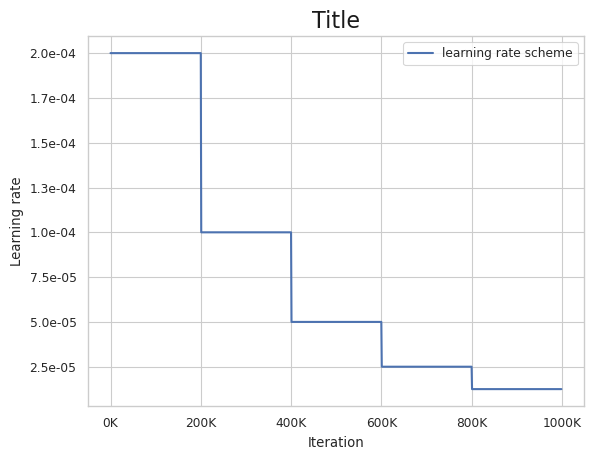

In [10]:
import tensorflow as tf


def MultiStepLR(initial_learning_rate, lr_steps, lr_rate, name='MultiStepLR'):
    """Multi-steps learning rate scheduler."""
    lr_steps_value = [initial_learning_rate]
    for _ in range(len(lr_steps)):
        lr_steps_value.append(lr_steps_value[-1] * lr_rate)
    return tf.keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=lr_steps, values=lr_steps_value)


def CosineAnnealingLR_Restart(initial_learning_rate, t_period, lr_min):
    """Cosine annealing learning rate scheduler with restart."""
    return tf.keras.experimental.CosineDecayRestarts(
        initial_learning_rate=initial_learning_rate,
        first_decay_steps=t_period, t_mul=1.0, m_mul=1.0,
        alpha=lr_min / initial_learning_rate)


if __name__ == "__main__":
    # pretrain PSNR lr scheduler
    lr_scheduler = MultiStepLR(2e-4, [200000, 400000, 600000, 800000], 0.5)

    # ESRGAN lr scheduler
    # lr_scheduler = MultiStepLR(1e-4, [50000, 100000, 200000, 300000], 0.5)

    # Cosine Annealing lr scheduler
    # lr_scheduler = CosineAnnealingLR_Restart(2e-4, 250000, 1e-7)

    ##############################
    # Draw figure
    ##############################
    N_iter = 1000000
    step_list = list(range(0, N_iter, 1000))
    lr_list = []
    for i in step_list:
        current_lr = lr_scheduler(i).numpy()
        lr_list.append(current_lr)

    import matplotlib as mpl
    from matplotlib import pyplot as plt
    import matplotlib.ticker as mtick
    mpl.style.use('default')
    import seaborn
    seaborn.set(style='whitegrid')
    seaborn.set_context('paper')

    plt.figure(1)
    plt.subplot(111)
    plt.ticklabel_format(style='sci', axis='x', scilimits=(0, 0))
    plt.title('Title', fontsize=16, color='k')
    plt.plot(step_list, lr_list, linewidth=1.5, label='learning rate scheme')
    legend = plt.legend(loc='upper right', shadow=False)
    ax = plt.gca()
    labels = ax.get_xticks().tolist()
    for k, v in enumerate(labels):
        labels[k] = str(int(v / 1000)) + 'K'
    ax.set_xticklabels(labels)
    ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))

    ax.set_ylabel('Learning rate')
    ax.set_xlabel('Iteration')
    fig = plt.gcf()
    plt.show()

In [11]:
class ResidualDenseBlock(keras.Model): 
    def __init__(self, filters):
        super(ResidualDenseBlock, self).__init__()
        # conv blocks
        self.conv_1 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')
        self.conv_2 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')
        self.conv_3 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')
        self.conv_4 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')
        self.conv_5 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')

        # Activation (Leaky Relu)
        self.act_1 = tf.keras.layers.LeakyReLU(alpha=0.2)
        self.act_2 = tf.keras.layers.LeakyReLU(alpha=0.2)
        self.act_3 = tf.keras.layers.LeakyReLU(alpha=0.2)
        self.act_4 = tf.keras.layers.LeakyReLU(alpha=0.2)
        
        # concatenation layer
        self.concat = tf.keras.layers.Concatenate()
        
    def call(self, x):
        x1 = self.act_1(self.conv_1(x))
        x2 = self.act_2(self.conv_2(layers.concatenate([x, x1])))
        x3 = self.act_3(self.conv_3(layers.concatenate([x, x1, x2])))
        x4 = self.act_4(self.conv_4(layers.concatenate([x, x1, x2, x3])))
        x5 = self.conv_5(layers.concatenate([x, x1, x2, x3, x4]))
        
        return x5 * 0.2 + x

In [12]:
class ResidualResidualDenseBlock(keras.Model):
    def __init__(self, filters):
        super(ResidualResidualDenseBlock, self).__init__()
        self.res_1 = ResidualDenseBlock(filters)
        self.res_2 = ResidualDenseBlock(filters)
        self.res_3 = ResidualDenseBlock(filters)
        
    def call(self, inputs): 
        x = self.res_1(inputs)
        x = self.res_2(x)
        x = self.res_3(x)
        
        return x + inputs * 0.2

In [13]:
class RRDBNet(keras.Model): 
    def __init__(self, num_rrdb, filters, upscale):
        super(RRDBNet, self).__init__()
        self.upscale = upscale
        
        self.conv_1 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')
        
        trunk = []
        for _ in range(num_rrdb):
            trunk.append(ResidualResidualDenseBlock(filters))
        self.trunk = tf.keras.Sequential(trunk)
        
        self.conv_2 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')
        
        if upscale == 2:
            self.upsampling1 = tf.keras.Sequential(
               [
                    Conv2D(filters=filters * (upscale ** 2), kernel_size=3, strides=1, padding='same'),
                    tf.keras.layers.LeakyReLU(alpha=0.2),
                    Lambda(self.pixel_shuffle(scale_factor=2))
               ]
            )
            
        if upscale == 4:
            self.upsampling1 = tf.keras.Sequential(
               [
                    Conv2D(filters=filters * (upscale ** 2), kernel_size=3, strides=1, padding='same'),
                    tf.keras.layers.LeakyReLU(alpha=0.2),
                    Lambda(self.pixel_shuffle(scale_factor=2))
               ]
            )
            self.upsampling2 = tf.keras.Sequential(
                [
                    Conv2D(filters=filters * (upscale ** 2), kernel_size=3, strides=1, padding='same'),
                    tf.keras.layers.LeakyReLU(alpha=0.2),
                    Lambda(self.pixel_shuffle(scale_factor=2))
                ]
            )
            
        if upscale == 8:
            self.upsampling1 = tf.keras.Sequential(
                [
                    Conv2D(filters=filters * (upscale ** 2), kernel_size=3, strides=1, padding='same'),
                    tf.keras.layers.LeakyReLU(alpha=0.2),
                    Lambda(self.pixel_shuffle(scale_factor=2))
                ]
            )
            self.upsampling2 = tf.keras.Sequential(
                [
                    Conv2D(filters=filters * (upscale ** 2), kernel_size=3, strides=1, padding='same'),
                    tf.keras.layers.LeakyReLU(alpha=0.2),
                    Lambda(self.pixel_shuffle(scale_factor=2))
                ]
            )
            self.upsampling3 = tf.keras.Sequential(
                [
                    Conv2D(filters=filters * (upscale ** 2), kernel_size=3, strides=1, padding='same'),
                    tf.keras.layers.LeakyReLU(alpha=0.2),
                    Lambda(self.pixel_shuffle(scale_factor=2))
                ]
            )
            self.upsampling4 = tf.keras.Sequential(
                [
                    Conv2D(filters=filters * (upscale ** 2), kernel_size=3, strides=1, padding='same'),
                    tf.keras.layers.LeakyReLU(alpha=0.2),
                    Lambda(self.pixel_shuffle(scale_factor=2))
                ]
            )
            
        self.conv_3 = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same')
        self.lrelu_3 =  tf.keras.layers.LeakyReLU(alpha=0.2)
        
        self.conv_4 = Conv2D(filters=3, kernel_size=3, strides=1, padding='same')

    
    def call(self, x):
        conv_1 = self.conv_1(x)
        x = self.trunk(conv_1)
        x = self.conv_2(x)
        x = Add()([x, conv_1])

        if self.upscale == 2:
            x = self.upsampling1(x)
            
        if self.upscale == 4:
            x = self.upsampling1(x)
            x = self.upsampling2(x)
            
        if self.upscale == 8:
            x = self.upsampling1(x)
            x = self.upsampling2(x)
            x = self.upsampling3(x)
            #x = self.upsampling4(x)

        x = self.conv_3(x)
        x = self.lrelu_3(x)
        x = self.conv_4(x)

        return x
    
    def upsample(self, x, scale, num_filters):
        def upsample_1(x, factor, **kwargs):
            x = Conv2D(num_filters * (factor ** 2), 3, padding='same', **kwargs)(x)
            return Lambda(pixel_shuffle(scale=factor))(x)

        if scale == 2:
            x = upsample_1(x, 2, name='conv2d_1_scale_2')
        elif scale == 3:
            x = upsample_1(x, 3, name='conv2d_1_scale_3')
        elif scale == 4:
            x = upsample_1(x, 2, name='conv2d_1_scale_2')
            x = upsample_1(x, 2, name='conv2d_2_scale_2')

        return x
    
    def pixel_shuffle(self, scale_factor=2, **kwargs):
        return Lambda(lambda  x: tf.nn.depth_to_space(x, scale_factor), **kwargs)
    
    def summary(self):
        x = Input(shape=(24, 24, 3))
        model = Model(inputs=[x], outputs=self.call(x))
        return model.summary()

In [14]:
class Discriminator(keras.Model):
    def __init__(self, filters=64, strides=1) -> None:
        super(Discriminator, self).__init__()
        
        self.features = tf.keras.Sequential([
            # input size. (3) x 128 x 128
            Conv2D(64, kernel_size=3, strides=strides, padding='same', use_bias=False),
            tf.keras.layers.LeakyReLU(0.2),
            
            # state size. (64) x 64 x 64
            Conv2D(filters, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
            Conv2D(filters, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
            
            # state size. (128) x 32 x 32
            Conv2D(filters*2, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
            Conv2D(filters*2, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
            
            # state size. (256) x 16 x 16
            Conv2D(filters*4, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
            Conv2D(filters*4, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
            
            # state size. (512) x 8 x 8
            Conv2D(filters*8, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
            Conv2D(filters*8, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
            
            # state size. (512) x 4 x 4
            Conv2D(filters*8, kernel_size=3, strides=strides, padding='same', use_bias=False),
            BatchNormalization(momentum=0.8),
            tf.keras.layers.LeakyReLU(0.2),
        ])

        self.classifier = tf.keras.Sequential([
            Dense(filters*16),
            tf.keras.layers.LeakyReLU(0.2),
            Dense(1)
        ])

    def call(self, x):
        out = self.features(x)
        out = self.classifier(out)

        return out
    
    def summary(self):
        x = Input(shape=(96, 96, 3))
        model = Model(inputs=[x], outputs=self.call(x))
        return model.summary()

In [ ]:
dis = Discriminator()
dis.summary()

In [22]:
# training PSNR 

## **PSNR Training**

In [33]:
class PsNRTrainer(keras.models.Model): 
    def __init__(self, generator):
        super(PsNRTrainer, self).__init__()
        self.generator_loss_tracker = tf.keras.metrics.Mean()
        
        self.generator = generator
        
        self.summary_writer = tf.summary.create_file_writer(
        "logs/" + "fit/" + datetime.now().strftime("%Y%m%d-%H%M%S"))
    
    @property
    def metrics(self):
        pass 
    
    def call(self, inputs):
        sr = self.generator(inputs)
        return sr
    
    def compile(self, generator_optimizer):
        super().compile()
        self.generator_optimizer = generator_optimizer

    def train_step(self, inputs):
        lr_img, hr_img = inputs
        
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            # generate the super resolution image
            sr = self.generator(lr_img, training=True)
            
            # discriminator outpu            
            # loss
            pixel_loss = WEIGHT_PIXEL * self.compute_pixel_loss(hr_img, sr)
           

        ## Params
        gen_params = self.generator.trainable_weights
        
        # grads
        gen_grads = gen_tape.gradient(pixel_loss, gen_params)
        
        # Back Propagate
        self.generator_optimizer.apply_gradients(zip(gen_grads, gen_params))
        
        # loss tracker
        self.generator_loss_tracker.update_state(pixel_loss)

        #with self.summary_writer.as_default():
        #tf.summary.scalar('gen_total_loss', total_gen_loss, step=step//1000)
        #tf.summary.scalar('gen_gan_loss', gan_loss, step=step//1000)
        #tf.summary.scalar('gen_l1_loss', l1_loss, step=step//1000)
        #tf.summary.scalar('disc_loss', total_disc_loss, step=step//1000)
        return {
                "loss": self.generator_loss_tracker.result(), 
               }
    
    def test_step(self, val_ds):
        psnr_val = self.get_psnr(val_ds)
        ssim_val = self.get_ssim(val_ds)
        
        return psnr_val, ssim_val
    
    def compute_loss(self, hr, sr):
        loss_func = tf.keras.metrics.MeanAbsoluteError()
        loss = loss_func(hr, sr)
        return loss
    
    def get_psnr(self, ds):
        psnr_values = []
        for lr, hr in ds:
            # convert dtype to float32
            lr = tf.cast(lr, tf.float32)
            # get sr image from model
            sr = self.generator(lr)
            # clip values to 0,255
            sr = tf.clip_by_value(sr, 0, 255)
            # round up values
            sr = tf.round(sr)
            # change dtype to unint8
            sr = tf.cast(sr, tf.uint8)
            # get psnr value
            psnr_value = tf.image.psnr(hr, sr, max_val=255)[0]
            # append psnr value
            psnr_values.append(psnr_value)
        return tf.reduce_mean(psnr_values)
    
    def get_ssim(self, ds):
        ssim_values = []
        for lr,hr in ds:
            # convert dtype to float32
            lr = tf.cast(lr, tf.float32)
            # get sr image from model
            sr = self.generator(lr)
            # clip values to 0,255
            sr = tf.clip_by_value(sr, 0, 255)
            # round up values
            sr = tf.round(sr)
            # change dtype to unint8
            sr = tf.cast(sr, tf.uint8)
            # get ssim value
            ssim_value = tf.image.ssim(hr, sr, max_val=255).numpy()[0]
            # append ssim value
            ssim_values.append(ssim_value)
        return tf.reduce_mean(ssim_values)
    
    def get_mos(self, ds):
        pass 
    
    def compute_pixel_loss(self, hr, sr, criterion='l1'):
        """pixel loss"""
        if criterion == 'l1':
            loss_func = tf.keras.losses.MeanAbsoluteError()
            
        elif criterion == 'l2':
            loss_func = tf.keras.losses.MeanSquaredError()
            
        else:
            raise NotImplementedError(
            'Loss type {} is not recognized.'.format(criterion)) 
            
        loss_val = loss_func(hr, sr)
        return loss_val
    
    def compute_content_loss(self, hr_fmap, sr_fmap, criterion='l2'):
        """content loss"""
        if criterion == 'l1':
            loss_func = tf.keras.losses.MeanAbsoluteError()
            
        elif criterion == 'l2':
            loss_func = tf.keras.losses.MeanSquaredError() 
            
        else:
            raise NotImplementedError(
            'Loss type {} is not recognized.'.format(criterion)) 
            
        loss_val = loss_func(hr_fmap, sr_fmap)
        return loss_val
    
    def compute_discriminator_loss_ragan(self, real_img_output, fake_img_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        sigma = tf.sigmoid
        
        real_logits = sigma(real_img_output - tf.reduce_mean(fake_img_output))
        fake_logits = sigma(fake_img_output - tf.reduce_mean(real_img_output))
        return 0.5 * (
            cross_entropy(tf.ones_like(real_logits), real_logits) +
            cross_entropy(tf.zeros_like(fake_logits), fake_logits))


    def compute_discriminator_loss(self, real_img_output, fake_img_output):
        # fake image  output by the discrimnator
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        # real image loss (30 * 30 * 3)
        real_loss = cross_entropy(tf.ones_like(real_img_output), real_img_output)
        # real image loss (30 * 30 * 3)
        fake_loss = cross_entropy(tf.zeros_like(fake_img_output), fake_img_output)
        total_loss = real_loss + fake_loss
        
        return total_loss 
    
    def compute_generator_loss_ragan(self, real_img_output, fake_img_output):
        cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        sigma = tf.sigmoid
        
        real_logits = sigma(real_img_output - tf.reduce_mean(fake_img_output))
        fake_logits = sigma(fake_img_output - tf.reduce_mean(real_img_output))
        return 0.5 * (
            cross_entropy(tf.ones_like(fake_logits), fake_logits) +
            cross_entropy(tf.zeros_like(real_logits), real_logits))

In [50]:
g_lr = MultiStepLR(1e-4, [1000, 2000, 4000, 8000, 16000, 32000], 0.5)
generator_optimizer = tf.keras.optimizers.Adam(g_lr, beta_1=0.9, beta_2=0.999)

generator = RRDBNet(2,  64, 4)
model = PsNRTrainer(generator)
model.compile(generator_optimizer)

In [51]:
ckpt = tf.train.Checkpoint(step=tf.Variable(1),
                           generator_optimizer=generator_optimizer,
                           model=model,
                           psnr=tf.Variable(-1.0),
                           ssim = tf.Variable(-1.0)
                          )
manager = tf.train.CheckpointManager(ckpt, './tf_ckpt_psrn', max_to_keep=3)

In [52]:
def train(model, train_ds, test_ds, epochs, manager):
    loss_list = []
    psnr_list = []
    ssim_list = []
    
    ckpt.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("Restored from {}".format(manager.latest_checkpoint))
    else:
        print("Initializing from scratch.")
    
    for epoch in range(epochs):
        for step, train_data_batch in tqdm(enumerate(train_ds), total=len(train_ds)):
           
            result = model.train_step(train_data_batch)
            loss = result.get("loss")
            
            ckpt.step.assign_add(1)
            
        # test step
        psnr_val, ssim_val = model.test_step(test_ds)
        psnr_list.append(psnr_val)
        ssim_list.append(ssim_val)
        
        if psnr_val > ckpt.psnr: 
            save_path = manager.save()
            ckpt.psnr = psnr_val
            print("Saved checkpoint for step {}: {}".format(int(ckpt.step), save_path))
        
        m_psnr_val = np.mean(psnr_list)
        m_ssim_val = np.mean(ssim_list)
        loss_list.append(loss)
        
        print(f"Epochs: {epoch}, loss: {loss}, PSNR: {m_psnr_val}, SSIM: {m_ssim_val}")
    return model

In [54]:
model = train(model, train_ds, val_ds.take(2), 5, manager)

Restored from ./tf_ckpt_psrn/ckpt-6


100%|██████████| 800/800 [03:13<00:00,  4.13it/s]


Saved checkpoint for step 5601: ./tf_ckpt_psrn/ckpt-7
Epochs: 0, loss: 0.0987037643790245, PSNR: 25.934947967529297, SSIM: 0.7641713619232178


100%|██████████| 800/800 [03:09<00:00,  4.23it/s]


Saved checkpoint for step 6401: ./tf_ckpt_psrn/ckpt-8
Epochs: 1, loss: 0.09625977277755737, PSNR: 25.937089920043945, SSIM: 0.7645424008369446


100%|██████████| 800/800 [03:13<00:00,  4.12it/s]


Saved checkpoint for step 7201: ./tf_ckpt_psrn/ckpt-9
Epochs: 2, loss: 0.09412872046232224, PSNR: 25.95625877380371, SSIM: 0.764979898929596


100%|██████████| 800/800 [03:19<00:00,  4.01it/s]


Saved checkpoint for step 8001: ./tf_ckpt_psrn/ckpt-10
Epochs: 3, loss: 0.0927567332983017, PSNR: 25.970462799072266, SSIM: 0.7656480073928833


100%|██████████| 800/800 [03:16<00:00,  4.07it/s]


Saved checkpoint for step 8801: ./tf_ckpt_psrn/ckpt-11
Epochs: 4, loss: 0.09135717898607254, PSNR: 25.984966278076172, SSIM: 0.7662209272384644


In [56]:
model.generator.save_weights('esrgan_psnr_weights.h5')

## Network Interpolation

In [57]:
GAN_PRETRAINED_WEIGHTS_DIR = "esrgan_2_rrdb_generator_weights.h5"
PSRN_PRETRAINED_WEIGHTS_DIR = "esrgan_psnr_weights.h5"

ALPHA = 0.8

In [82]:
esrgan_generator = RRDBNet(2, 64, 4)
esrgan_generator.build((1, 24, 24, 3))
esrgan_generator.load_weights(GAN_PRETRAINED_WEIGHTS_DIR)

In [83]:
esrgan_psnr = RRDBNet(2, 64, 4)
esrgan_psnr.build((1, 24, 24, 3))
esrgan_psnr.load_weights(PSRN_PRETRAINED_WEIGHTS_DIR)

In [84]:
new_interpolation_weights = esrgan_psnr.get_weights()

psnr_weights = esrgan_psnr.get_weights()
esrgan_gen_weights = esrgan_generatpr.get_weights()

In [85]:
len(new_interpolation_weights)

72

In [86]:
for _ in range(len(psnr_weights)):
    new_interpolation_weights[_] = (ALPHA) * psnr_weights[_] + (1-ALPHA) * esrgan_gen_weights[_]

In [87]:
esrgan_generator.set_weights(new_interpolation_weights)
esrgan_generator.save_weights('esrgan_net_interpolation_weights.h5')

psnr; 20.580007553100586, ssim: 0.4513028860092163


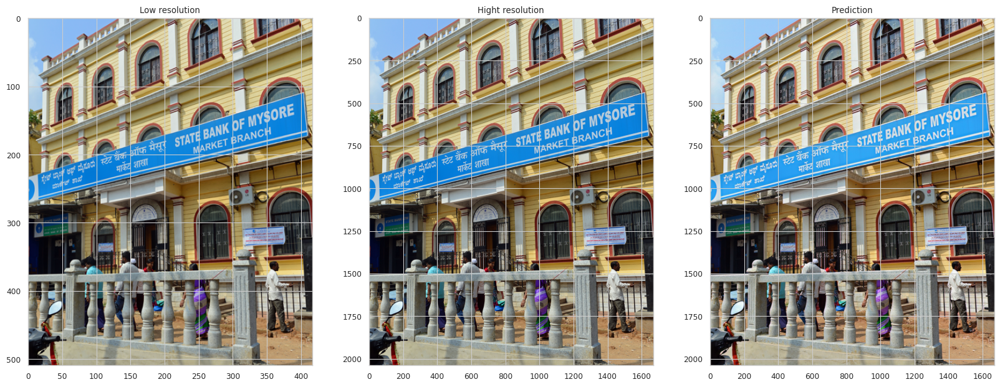

psnr; 24.02395248413086, ssim: 0.6322205066680908


<Figure size 640x480 with 0 Axes>

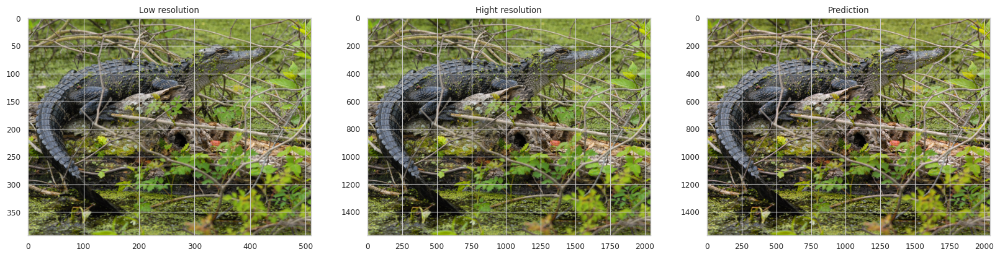

psnr; 21.435428619384766, ssim: 0.4452788531780243


<Figure size 640x480 with 0 Axes>

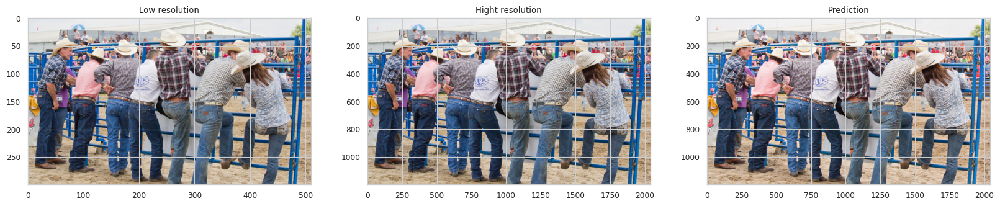

psnr; 24.693927764892578, ssim: 0.5026041865348816


<Figure size 640x480 with 0 Axes>

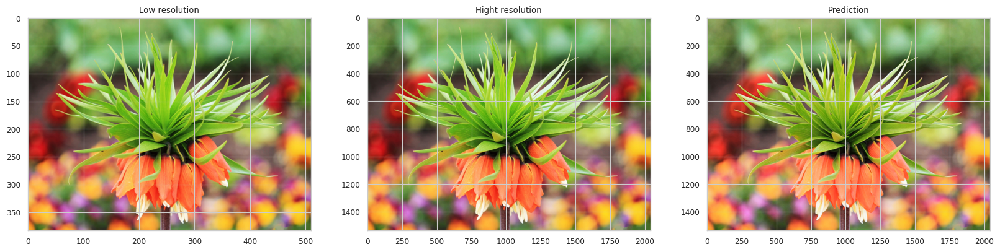

psnr; 25.76700210571289, ssim: 0.5854371190071106


<Figure size 640x480 with 0 Axes>

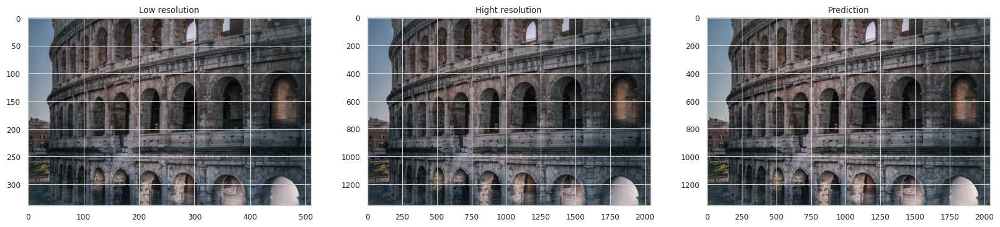

<Figure size 640x480 with 0 Axes>

In [88]:
def plot_results(lowres, preds, highres):
    """
    Displays low resolution image and super resolution image
    """
    plt.figure(figsize=(20, 10))
    plt.subplot(131), plt.imshow(lowres/255.0), plt.title("Low resolution")
    plt.subplot(132), plt.imshow(highres/255.0), plt.title("Hight resolution")
    plt.subplot(133), plt.imshow(preds/255.0), plt.title("Prediction")
    plt.show()
    plt.savefig("wdsr_a_res.png")

for lr, hr in val_ds.take(5):
    lr = lr[0]
    hr = hr[0]

 #   lowres = tf.image.random_crop(lowres, (64, 64, 3))
    lr = tf.expand_dims(lr, 0)
    hr = tf.cast(hr, tf.float32)
    lr = tf.cast(lr, tf.float32)
    
    sr = esrgan_generatpr(lr)
    sr = sr[0]
    sr = tf.cast(sr, tf.float32)
    lr = lr[0]
    
    psnr = tf.image.psnr(sr, hr, max_val=255)
    ssim = tf.image.ssim(sr, hr, max_val=255)
    print(f"psnr; {psnr}, ssim: {ssim}")
    
    plot_results(lr, sr, hr)

psnr; 24.349699020385742, ssim: 0.722430944442749


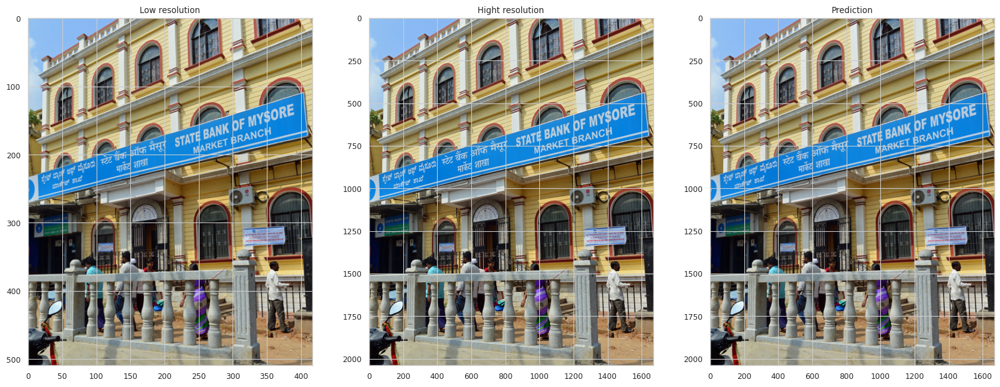

psnr; 27.739032745361328, ssim: 0.8151741027832031


<Figure size 640x480 with 0 Axes>

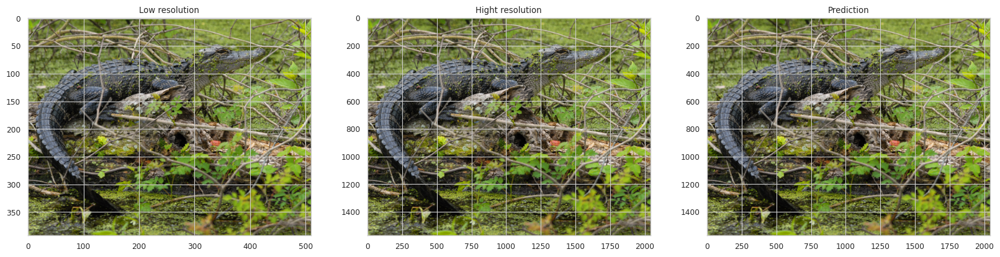

psnr; 25.997783660888672, ssim: 0.7326433658599854


<Figure size 640x480 with 0 Axes>

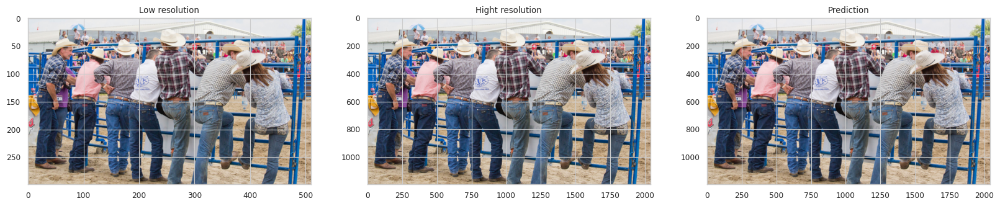

psnr; 34.3693962097168, ssim: 0.9362912178039551


<Figure size 640x480 with 0 Axes>

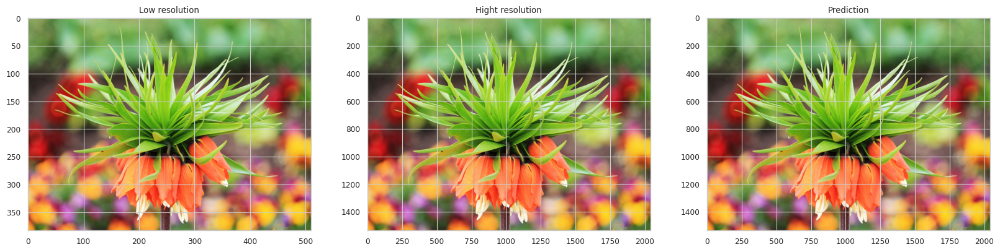

psnr; 29.221412658691406, ssim: 0.7583039402961731


<Figure size 640x480 with 0 Axes>

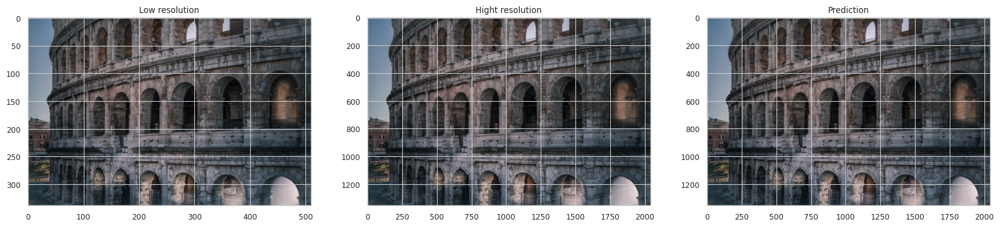

<Figure size 640x480 with 0 Axes>

In [79]:
def plot_results(lowres, preds, highres):
    """
    Displays low resolution image and super resolution image
    """
    plt.figure(figsize=(20, 10))
    plt.subplot(131), plt.imshow(lowres/255.0), plt.title("Low resolution")
    plt.subplot(132), plt.imshow(highres/255.0), plt.title("Hight resolution")
    plt.subplot(133), plt.imshow(preds/255.0), plt.title("Prediction")
    plt.show()
    plt.savefig("wdsr_a_res.png")

for lr, hr in val_ds.take(5):
    lr = lr[0]
    hr = hr[0]

 #   lowres = tf.image.random_crop(lowres, (64, 64, 3))
    lr = tf.expand_dims(lr, 0)
    hr = tf.cast(hr, tf.float32)
    lr = tf.cast(lr, tf.float32)
    
    sr = esrgan_psnr(lr)
    sr = sr[0]
    sr = tf.cast(sr, tf.float32)
    lr = lr[0]
    
    psnr = tf.image.psnr(sr, hr, max_val=255)
    ssim = tf.image.ssim(sr, hr, max_val=255)
    print(f"psnr; {psnr}, ssim: {ssim}")
    
    plot_results(lr, sr, hr)

## **TFLite Conversion and Inference**

In [ ]:
GAN_PRETRAINED_WEIGHTS_DIR = "esrgan_2_rrdb_generator_weights.h5"
TFLITE_SAVE_DIR = "esrgan_2_rrdb_generator.tflite"

In [ ]:
model = RRDBNet(2, 64, 4)
model.set_weights(GAN_PRETRAINED_WEIGHTS_DIR)
converter = tf.lite.TFLiteConverter.from_keras_model(model)
#converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()
with open(TFLITE_SAVE_DIR, 'wb') as f:
    f.write(tflite_model)

In [ ]:
TFLITE_MODEL_PATH = '.esrgan_2_rrdb_generator.tflite'
IMG_PATH = "./images/input_hr/0855.png"
SAVE_IMG_PATH = "./images/results/tflite_0855.png"

INPUT_SHAPE = 24

def main():
    interpreter = tf.lite.Interpreter(model_path=TFLITE_MODEL_PATH)
    interpreter.allocate_tensors()
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    input_index = input_details[0]["index"]
    output_index = output_details[0]["index"]

    image = read_image(IMG_PATH)
    input_image = tf.image.resize(image, INPUT_SHAPE, method=tf.image.ResizeMethod.BICUBIC)
    input_image = scale_image_0_1_range(input_image)
    input_image = tf.expand_dims(input_image, axis=0)

    interpreter.set_tensor(input_index, input_image)

    interpreter.invoke()
    output = interpreter.get_tensor(output_index)
    # Convert output array to image
    output_image = (np.squeeze(output, axis=0).clip(0, 1) * 255).astype(np.uint8)

    img = Image.fromarray(output_image)
    img.save(SAVE_IMG_PATH)